# Lab 3 Final Part 1
## Hubble constant over the years, MCMC Sampling, and Bayesian combination of potentially incompatible measurements

Using a heterogeneous collection of Hubble constant measurements, we calculate some 'conventional statistics' as well as 
a more involved Bayesian analysis, as described in Press (1996).  

Each of these has value as a way to represent or explore a data set; there is no single correct approach. 

This notebook includes a subset of calculations from parts 3a and 3b that were initiated in class, including the construction of the Metropolis sampler.
Feel free to submit those separately or add to this one.
                                                                           )

# Hubble Constant Data Compilation

H0_data.csv is a table with 5 columns:

* year - Sometimes this is an integer --- we 'dither' the year so these don't pile up in our plots
* H0   - Hubble constant in km/s per Mpc 
* eH0  - Reported standard deviation error on Hubble constant
* ObsType - Method used for measuring Hubble constant - note 'LCDM' are typically CMB-based
* Reference - Cited reference

Data have been obtained from two sources.
1. The H0 page that had been maintained by John Huchra, who was an astronomer at Harvard CfA https://lweb.cfa.harvard.edu/~dfabricant/huchra/hubble.plot.dat

2. The Hubble Tension Survey: A Statistical Analysis of the 2012-2022 Measurements https://arxiv.org/abs/2311.18443

These have been combined to produce a relatively continuous data set up to the present.  Note that this measurements in this complication are not guaranteed to be independent.  Some reported analyses may include the same underlying measurements. There may be other ways that the data are covariant, or biased.  However, for the purposes of this exercise, we'll assume independence.  (Prior analyses suggest that results won't change significantly if the table is trimmed to a smaller, more securely independent subsample.)

### Step 1: Read in the table, initial statistical analysis

Generate some basic statistics for H0, where we select by year and by error. Use the conventional statistics in the Press (1996) paper to determine the basic properties of the distribution

https://arxiv.org/pdf/astro-ph/9604126

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.table import Table

In [2]:
# Table of Hubble Constant measurements, over past ~100 years

# Read the CSV file
table = Table.read("./H0_Data.csv", format="ascii.csv")

year = np.array(table["Year"], dtype="float64")
dither = np.random.uniform(size=len(year))
# Add a small dither offset to year to avoid integer pile-up
year_dith = year + dither


H0 = np.array(table["H0"], dtype="float64")
eH0 = np.array(table["eH0"], dtype="float64")
no_errors = np.where(eH0 < 0.1)[0]
eH0[no_errors] = (
    5  # Replace some with very small error bars with a larger value so as not to interfere
)
obsType = np.array(table["ObsType"])

print(H0.size)

766


### Step 2:  To do: Fill in some of the formulae below

In [3]:
# Calculate some basic statistics
# Weighted mean (which is equivalent of the chi-square)

year_cut = 2010
error_cut = 20
select = np.where((year_dith > year_cut) & (eH0 < error_cut))[0]
not_selected = np.where((year_dith < year_cut) | (eH0 > error_cut))[0]

# This is just an unweighted standard deviation from the data
print("H0 mean (unweighted)", np.mean(H0[select]))
print("H0 median (unweighted)", np.median(H0[select]))
print("H0 standard deviation (unweighted)", np.std(H0[select]))


# Eq 3.1
h0_mean_weight = np.sum(H0[select] / eH0[select] ** 2) / np.sum(1 / eH0[select] ** 2)
# Eq. 3.2
h0_mean_var_weight = h0_mean_var_weight = np.sqrt(1 / np.sum(1 / eH0[select] ** 2))

print("H0 weighted mean:", h0_mean_weight)
print("H0 weighted std of mean:", np.sqrt(h0_mean_var_weight))

# Eq. 3.6
chisq = np.sum((H0[select] - h0_mean_weight) ** 2 / eH0[select] ** 2)
reduced_chisq = chisq / (len(select) - 1)
print("H0 chisq:", chisq)
print("Number of measurements or degrees of freedom+1:", len(select))
print("Chi Squared per DOF:", chisq / (len(select) - 1))

H0 mean (unweighted) 70.63132075471698
H0 median (unweighted) 70.0
H0 standard deviation (unweighted) 3.5695855093325846
H0 weighted mean: 69.33784905878217
H0 weighted std of mean: 0.2792045464602099
H0 chisq: 528.8318471831001
Number of measurements or degrees of freedom+1: 212
Chi Squared per DOF: 2.5063120719578205


### Step 3: Visualize the H0 data set, display 'conventional statistics' on these plots

Note that we have highlighted below a subsample that has been labelled with an obsType 'LCDM'.  These are not strictly data derived from CMB measurements (high redshift) but can be assumed so, to a first approximation.

To do: Add quantities you have calculated above to the plots below


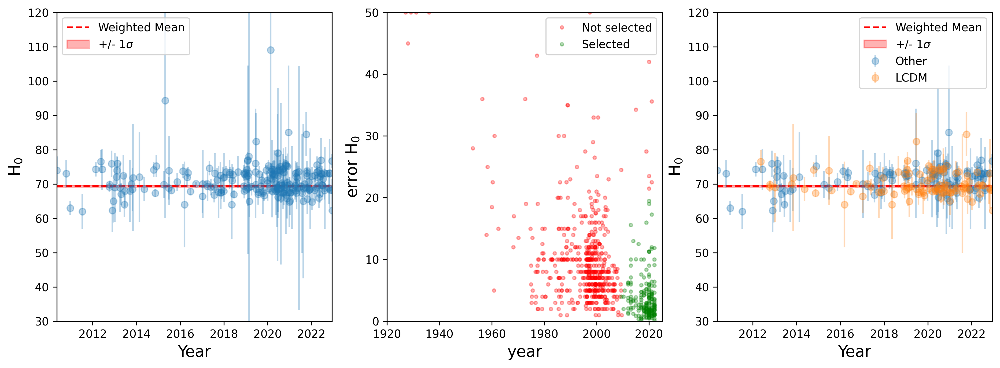

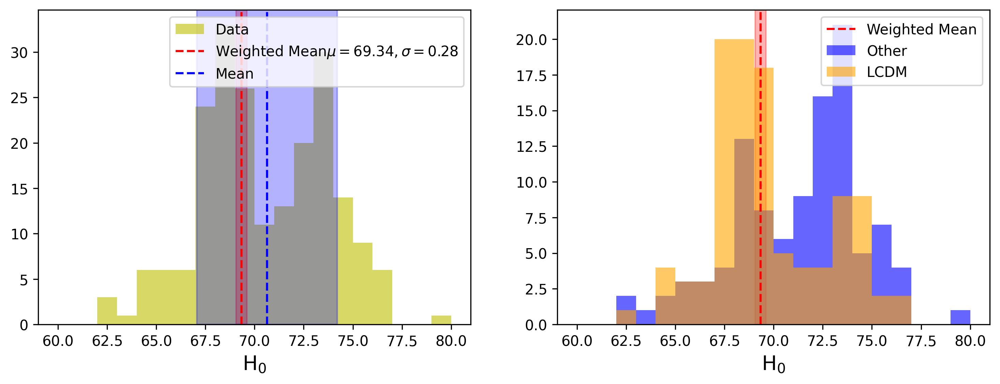

In [4]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5), dpi=300)

# H0 measurements and error bars vs. time

# To do: overplot weighted mean, plus range (+/-) of weighted std of the mean
ax[0].axhline(h0_mean_weight, color="red", linestyle="--", label="Weighted Mean")
ax[0].axhspan(
    h0_mean_weight - np.sqrt(h0_mean_var_weight),
    h0_mean_weight + np.sqrt(h0_mean_var_weight),
    color="red",
    alpha=0.3,
    label="+/- 1$\sigma$",
)

ax[2].axhline(h0_mean_weight, color="red", linestyle="--", label="Weighted Mean")
ax[2].axhspan(
    h0_mean_weight - np.sqrt(h0_mean_var_weight),
    h0_mean_weight + np.sqrt(h0_mean_var_weight),
    color="red",
    alpha=0.3,
    label="+/- 1$\sigma$",
)

p1 = np.where((year_dith > year_cut) & (eH0 < error_cut) & (obsType != "LCDM"))[0]
ax[0].errorbar(year_dith, H0, yerr=eH0, alpha=0.3, marker="o", linestyle="none")
ax[0].set_xlim(np.min(year_dith[p1]), np.max(year_dith[p1]))
ax[0].set_ylim(30, 120)
ax[0].set_ylabel("H$_0$", fontsize=14)
ax[0].set_xlabel("Year", fontsize=14)
ax[0].legend()

# Distribution of errors vs. time
# Green are selected values
ax[1].plot(
    year[not_selected],
    eH0[not_selected],
    marker=".",
    color="red",
    linestyle="none",
    alpha=0.3,
    label="Not selected",
)
ax[1].plot(
    year[select],
    eH0[select],
    marker=".",
    linestyle="none",
    color="green",
    alpha=0.3,
    label="Selected",
)
ax[1].set_xlim(1920, 2025)
ax[1].set_ylim(0, 50)
ax[1].legend()
ax[1].set_xlabel("year", fontsize=14)
ax[1].set_ylabel("error H$_0$", fontsize=14)


p1 = np.where((year_dith > year_cut) & (eH0 < error_cut) & (obsType != "LCDM"))[0]
ax[2].errorbar(
    year_dith[p1],
    H0[p1],
    yerr=eH0[p1],
    alpha=0.3,
    marker="o",
    linestyle="none",
    label="Other",
)
p2 = np.where((year_dith > year_cut) & (eH0 < error_cut) & (obsType == "LCDM"))[0]
ax[2].errorbar(
    year_dith[p2],
    H0[p2],
    yerr=eH0[p2],
    alpha=0.3,
    marker="o",
    linestyle="none",
    label="LCDM",
)
ax[2].set_xlim(np.min(year_dith[p1]), np.max(year_dith[p1]))
ax[2].set_ylim(30, 120)
ax[2].set_ylabel("H$_0$", fontsize=14)
ax[2].set_xlabel("Year", fontsize=14)
ax[2].legend()


xrange = [60, 80]

fig, ax = plt.subplots(1, 2, figsize=(12, 4), dpi=300)
ax[0].hist(H0[select], bins=20, alpha=0.6, color="y", label="Data", range=xrange)
ax[0].set_xlabel("H$_0$", fontsize=14)

# Simple histogram distribution of H0 values
# To-do Overplot mean and standard error of the mean
ax[0].axvline(
    h0_mean_weight,
    color="red",
    linestyle="--",
    label=r"Weighted Mean$\mu = {:.2f}, \sigma = {:.2f}$".format(
        h0_mean_weight, np.sqrt(h0_mean_var_weight)
    ),
)
ax[0].axvspan(
    h0_mean_weight - np.sqrt(h0_mean_var_weight),
    h0_mean_weight + np.sqrt(h0_mean_var_weight),
    color="red",
    alpha=0.3,
)
ax[0].axvline(np.mean(H0[select]), color="blue", linestyle="--", label="Mean")
ax[0].axvspan(
    np.mean(H0[select]) - np.std(H0[select]),
    np.mean(H0[select]) + np.std(H0[select]),
    color="blue",
    alpha=0.3,
)


ax[0].legend()

# Simple histogram distribution of H0 values - split by non-LCDM vs. LCDM
# To-do Overplot mean and standard error of the mean
# Orange are CMB measured values
ax[1].axvline(h0_mean_weight, color="red", linestyle="--", label="Weighted Mean")
ax[1].axvspan(
    h0_mean_weight - np.sqrt(h0_mean_var_weight),
    h0_mean_weight + np.sqrt(h0_mean_var_weight),
    color="red",
    alpha=0.3,
)

ax[1].hist(H0[p1], bins=20, alpha=0.6, color="blue", label="Other", range=xrange)
ax[1].hist(H0[p2], bins=20, alpha=0.6, color="orange", label="LCDM", range=xrange)
ax[1].set_xlabel("H$_0$", fontsize=14)
ax[1].legend()
plt.show()

### Questions:

* Do the conventional statistics provide a good measure of the data?  Why or why not? 
> To some extent it does assuming that $\Lambda$ CDM is the correct theory and that there is not some clear bifurcation between the recent measures of H0, as can be seen in the last histogram. That is, if it's strictly a single-peaked distribution with systematic errors ruled out -- conventional statistics: mean and error in the mean would be good enough.


* For certain analyses these measures may be sufficient for describing the data, and others not.  For what situations might it be fine to stop at this point?    When might we want to explore further?

> I would say that if you are doing anything that is not precision cosmology, then I think this would be enough. For example, if you need to get luminosities of high-z objects, I think it would be ok to stop here and just use the value presented by CMB measurements, as most people do (they usually cite the cosmology they use in the beginning of their analyses). In terms of precision cosmology, people who want to actually characterize the expansion rate and other cosmology parameters ($\Omega_m$ etc) should definately look more carefully at this.


## Bayesian Analysis of H0 Data and Combination of Incompatible Measurements (Press 1996; Press & Kochanek 1997 )

Below is a partial implementation of the method described in Press (1996) that provides a Bayesian analysis that, given N measurements of H0 and eH0, constructs a multiparameter model that includes parameters:
1. **H0_par** - the true value of H0.  (Here it is assumed to be constant vs. z.) 
2. **p**: An overall probability that measurements, as reported, are good.  "Good" could mean that a measurement and its error bars are accurate and unbiased. Or "good" could mean that the measurement is simply compatible with most of the others.
3. **v**: An N-length vector of binary flags indicating whether any given measurement is "good" or "bad"

__The model also assumes that the scatter in the "bad" data are better described using a normal distribution__ with mean H0_par, but standard deviation, S.  S should be much broader than the typically reported eH0, and could be a free parameter of the model.  In our case, we set S to some value, which can be adjusted.

This model has 2+N parameters, a large number of parameters! We seemingly have more parameters than individual measurements---though our data set includes 2N quantities, H0 and eH0.  Additionally, the parameters **p** and **v** are not independent, since **p** should be the expected value of the average value of **v**. p = E[(sum of v_i)/N]

### Implementation Approach

Below is an implementation to perform this analysis on a portion of the H0 data set (using more recent data)  The implementation
is a hybrid of Gibbs and Metropolis sampling, with steps:
  
In each sampling step, first determine individual elements v_i of the vector v, using the likelihood P(v_i|Data,H0,p)P(p_prior).  From the new **v** we can recalculate a new **p**. Then in the next step we propose a new value for **H0_par**.  We then calculate the likelihood at this new proposed position, and following the Metropolis method, we calculate a ratio of likelihoods (current vs. last position) and compare to a uniform draw as an adoption criterion, deciding to accept the new parameters, or retain the old ones at this sampling step.




The key functions are in the cell below:
* evolve_v(H0arr,eH0arr,H0_par,S,p_prior)
* prob_def_eq_16(H0arr,eH0arr,H0_par,p,S) - This is based on Eq. 16 in Press (1996)
* H0propose(H0_t,H0_step)
* MCMC(H0arr,eH0arr,H0_t,S,p_prior,v_t,iter,verbose='False')


In [ ]:
############
def evolve_v(H0arr, eH0arr, H0_par, S, p_prior):
    # For a given measurement H0arr[i], eH0arr[i], and parameters H0_par, S, p_prior
    # Draw a new v_i (0 or 1) from the marginal posterior distribution

    n_meas = np.array(H0arr).size
    v_new = np.zeros(n_meas)
    for i in np.arange(n_meas):
        # Probability that a measurement is "good" * prior
        pGi = (
            p_prior
            * (1.0 / np.sqrt(2.0 * np.pi * eH0arr[i] ** 2))
            * np.exp(-((H0arr[i] - H0_par) ** 2) / (2.0 * eH0arr[i] ** 2))
        )
        # Probability that a measurement is "bad" * prior
        pBi = (
            (1 - p_prior)
            * (1.0 / np.sqrt(2.0 * np.pi * S**2))
            * np.exp(-((H0arr[i] - H0_par) ** 2) / (2.0 * S**2))
        )
        # Normalized likelihood that measurement is good (only options are good and bad)
        p_good = pGi / (pGi + pBi)
        # Draw a random number between 0 and 1
        u = np.random.uniform()
        # if less than p_good, set v_i=1 (is good)
        if u < p_good:
            v_new[i] = 1
        else:
            v_new[i] = 0
    return v_new


############


def prob_def_eq_16(H0arr, eH0arr, H0_par, p, S):

    # For now assume uniform prior on p H0, varr
    # Also, in sampling we don't worry about normalization

    n_meas = np.array(H0arr).size
    pH0_D_arr = np.zeros(n_meas)

    ptot = 0
    for i in np.arange(n_meas):
        pGi = (1.0 / np.sqrt(2.0 * np.pi * eH0arr[i] ** 2)) * np.exp(
            -((H0arr[i] - H0_par) ** 2) / (2.0 * eH0arr[i] ** 2)
        )
        pBi = (1.0 / np.sqrt(2.0 * np.pi * S**2)) * np.exp(
            -((H0arr[i] - H0_par) ** 2) / (2.0 * S**2)
        )
        pH0_D_arr[i] = (p * pGi + (1 - p) * pBi) / ((pGi + pBi) / 2.0)
        #        pH0_D_arr[i]=(p*pGi+(1-p)*pBi)
        ptot = ptot + np.log(pH0_D_arr[i])
    #    print(ptot,(n_meas*p)*np.log(p)+(n_meas*(1-p))*np.log(1-p))
    return ptot


############


def H0propose(H0_t, H0_step):
    # Uniform distribution
    return H0_t + (np.random.uniform() - 0.5) * H0_step


############


def MCMC(H0arr, eH0arr, H0_t, S, p_prior, v_t, iter, H0_step, verbose="False"):
    # Perform a full sampling sequence for v, recalculate p, and H0_par

    n_meas = np.array(H0arr).size
    p_t = np.mean(v_t)

    v_samp_arr = np.zeros((iter, n_meas))  # samples of vector v
    p_samp_arr = np.zeros(iter)  # samples of p (derived as mean of v)
    H0_samp_arr = np.zeros(iter)  # samples of H0_par
    ln_samp_arr = np.zeros(iter)  # log likelihood at each sampling step
    accept_arr = np.zeros(iter)  # whether step represents a new accepted value

    # Start loop with iterations
    for i in np.arange(iter):
        # log likelihood at last position
        ln_pH0_t = prob_def_eq_16(H0arr, eH0arr, H0_t, p_t, S)
        # make new proposal for v
        v_curr = evolve_v(H0arr, eH0arr, H0_t, S, p_prior)
        # calculate new expected p for this v
        p_curr = np.mean(v_curr)
        # propose new H0
        H0_curr = H0propose(H0_t, H0_step)
        # determine log likelihood at new proposed position
        ln_pH0_curr = prob_def_eq_16(H0arr, eH0arr, H0_curr, p_curr, S)
        # Calculate likelihood ratio
        pH0_ratio = np.exp(ln_pH0_curr - ln_pH0_t)

        # Metropolis algorithm for accepting or rejecting
        utrial = np.random.uniform()
        if utrial < pH0_ratio:
            # Use new sampling point
            v_samp_arr[i, :] = v_curr
            p_samp_arr[i] = p_curr
            H0_samp_arr[i] = H0_curr
            accept_arr[i] = 1
            ln_samp_arr[i] = ln_pH0_curr
        else:
            # Repeat last sampling point
            v_samp_arr[i, :] = v_t
            p_samp_arr[i] = p_t
            H0_samp_arr[i] = H0_t
            accept_arr[i] = 0
            ln_samp_arr[i] = ln_pH0_t
        v_t = v_samp_arr[i, :]
        H0_t = H0_samp_arr[i]
        p_t = np.mean(v_t)
        if verbose:
            print(
                i,
                H0_samp_arr[i],
                p_samp_arr[i],
                accept_arr[i],
                ln_samp_arr[i],
                pH0_ratio,
            )
        if int(i / 100) == i / 100:
            print("iter:", i)
    return (H0_samp_arr, v_samp_arr, p_samp_arr, accept_arr, ln_samp_arr)

When running the below models, you can use the default settings, which extract 300 data points from the last 600 in the table. 

The current default prior on p is 0.8, meaning that 80% of data should be accurate, compatible, good, etc.  That is a reasonable assumption for work that has made it into the literature(!) but you can try raising and lowering this to see the impact on results.

Additional parameters that can be adjusted are the H0_step size

iter: 0
iter: 100
iter: 200
iter: 300
iter: 400
iter: 500
iter: 600
iter: 700
iter: 800
iter: 900
Acceptance ratio: 0.257
Acceptance ratios between 0.2-0.3 are a good target.


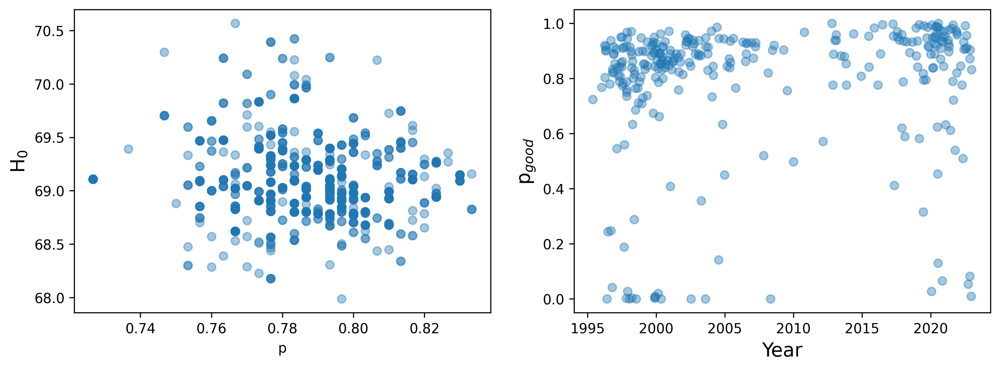

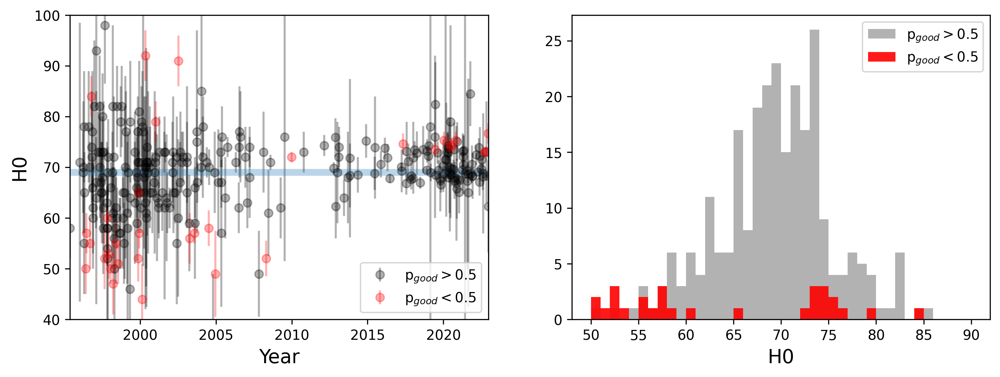

In [42]:
def bayesian_analysis(
    H0arr,
    eH0arr,
    year_dith_arr,
    p_prior=0.80,
    H0_step=4,
    H0_init=70.0,
    S=20,
    iter=1000,
    verbose=False,
    savefig=False,
):
    ############
    # Model H0 distribution, following Press (1996)
    ############

    # extract sampling of recent data from the full table
    # (~300 entries, every other)
    # H0arr = H0[-600::2]
    # eH0arr = eH0[-600::2]
    # year_dith_arr = year_dith[-600::2]

    # Most recent data - Useful for highlighting 'Hubble Tension'
    # H0arr=H0[-200::1]
    # eH0arr=eH0[-200::1]
    # year_dith_arr=year_dith[-200::1]
    # print(H0arr)

    n_meas = np.array(H0arr).size  # Number of measurements

    # p_prior = 0.80  # Prior on community 'compatibility'

    # changing to 0.50 deemed more points as 'bad' data - FABG

    # Make a random guess at v_i values, selecting with prior probability on good vs. bad
    v_init = np.random.binomial(1, p_prior, size=n_meas)

    # MCMC step for H0 parameter guesses  (possible step range is +/-H0_step/2)
    # Lower to increase acceptance ratio
    # H0_step = 4

    # Initial starting point on H0_par
    # H0_init = 70.0

    # Keep 'bad' data width a fixed parameter, sigma=20 in units of H0
    # Experiment with different bad data widths
    # S = 20

    # Initialize parameters for starting position (H0_t, v_t, p_t)
    H0_t = H0_init
    v_t = v_init
    p_t = np.mean(v_t)

    # MCMC number of iterations, initialize arrays
    iter = 1000

    #
    H0_samp_arr, v_samp_arr, p_samp_arr, accept_arr, ln_samp_arr = MCMC(
        H0arr, eH0arr, H0_t, S, p_prior, v_t, iter, H0_step, verbose=False
    )

    print("Acceptance ratio:", np.mean(accept_arr))
    print("Acceptance ratios between 0.2-0.3 are a good target.")

    # Make some plots to see results

    n_burn_in = 500

    # in some cases you might want to only use data after 'burn-in'

    fig, ax = plt.subplots(1, 2, figsize=(12, 4), dpi=300)
    ax[0].plot(p_samp_arr, H0_samp_arr, "o", alpha=0.4)
    ax[0].set_xlabel("p")
    ax[0].set_ylabel("H$_0$", fontsize=14)

    # Determine from v_i samples the fraction of time a point is identified as "good"
    # Only use points after burn-in has occurred
    p_good_arr = np.zeros(n_meas)
    for i in np.arange(n_meas):
        p_good_arr[i] = np.mean(v_samp_arr[n_burn_in:, i])

    ax[1].plot(year_dith_arr, p_good_arr, "o", alpha=0.4)
    ax[1].set_xlabel("Year", fontsize=14)
    ax[1].set_ylabel("p$_{good}$", fontsize=14)
    plt.show()

    # Show all points and highlight those that have p_good < 0.5
    fig, ax = plt.subplots(1, 2, figsize=(12, 4), dpi=300)
    p1 = np.where((p_good_arr > 0.5))[0]
    ax[0].errorbar(
        year_dith_arr[p1],
        H0arr[p1],
        yerr=eH0arr[p1],
        alpha=0.3,
        marker="o",
        linestyle="none",
        color="black",
        label="p$_{good}>0.5$",
    )

    p2 = np.where((p_good_arr < 0.5))[0]
    ax[0].errorbar(
        year_dith_arr[p2],
        H0arr[p2],
        yerr=eH0arr[p2],
        alpha=0.3,
        marker="o",
        linestyle="none",
        color="red",
        label="p$_{good}<0.5$",
    )
    ax[0].set_xlim(np.min(year_dith_arr[p1]), np.max(year_dith_arr[p1]))
    ax[0].set_ylim(40, 100)
    ax[0].set_ylabel("H0", fontsize=14)
    ax[0].set_xlabel("Year", fontsize=14)
    H0med = np.median(H0_samp_arr[-500:])
    ax[0].plot((1900, 2025), (H0med, H0med), linewidth=5, alpha=0.3)
    ax[0].legend()

    xrange = [50, 90]
    ax[1].hist(
        H0arr[p1],
        bins=40,
        alpha=0.3,
        color="black",
        range=xrange,
        label="p$_{good}>0.5$",
    )
    ax[1].hist(
        H0arr[p2], bins=40, alpha=0.9, color="red", range=xrange, label="p$_{good}<0.5$"
    )
    ax[1].set_xlabel("H0", fontsize=14)
    ax[1].legend()
    if savefig:
        plt.savefig("./H0_analysis_fiducial.png")
    plt.show()

    if verbose:
        return (
            H0_samp_arr,
            v_samp_arr,
            p_samp_arr,
            accept_arr,
            ln_samp_arr,
            n_meas,
            p_good_arr,
            eH0arr,
            H0arr,
            year_dith_arr,
        )


# includes mostly latest data we'll treat this as baseline
S = 20
(
    H0_samp_arr,
    v_samp_arr,
    p_samp_arr,
    accept_arr,
    ln_samp_arr,
    n_meas,
    p_good_arr,
    eH0arr,
    H0arr,
    year_dith_arr,
) = bayesian_analysis(
    H0[-600::2],
    eH0[-600::2],
    year_dith[-600::2],
    p_prior=0.80,
    H0_step=4,
    H0_init=70.0,
    S=S,
    iter=1000,
    verbose=True,
    savefig=True,
)

iter: 0
iter: 100
iter: 200
iter: 300
iter: 400
iter: 500
iter: 600
iter: 700
iter: 800
iter: 900
Acceptance ratio: 0.507
Acceptance ratios between 0.2-0.3 are a good target.


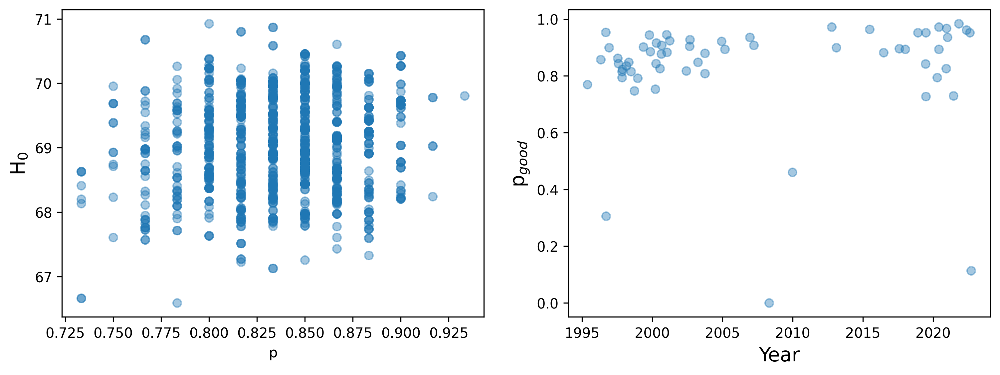

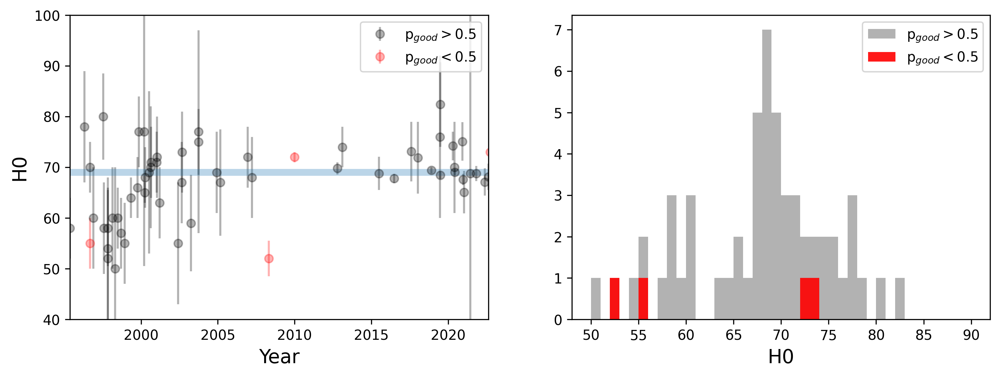

In [8]:
# includes more sparse data

bayesian_analysis(
    H0[-600::10],
    eH0[-600::10],
    year_dith[-600::10],
    p_prior=0.80,
    H0_step=4,
    H0_init=70.0,
    S=20,
    iter=1000,
)

iter: 0
iter: 100
iter: 200
iter: 300
iter: 400
iter: 500
iter: 600
iter: 700
iter: 800
iter: 900
Acceptance ratio: 0.113
Acceptance ratios between 0.2-0.3 are a good target.


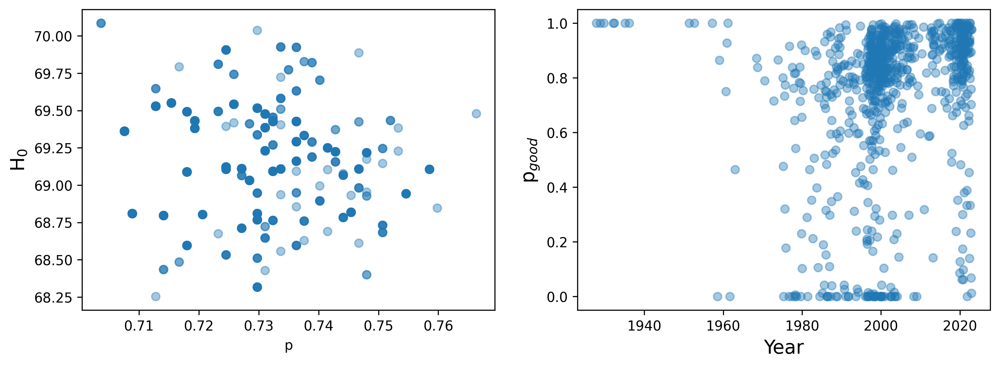

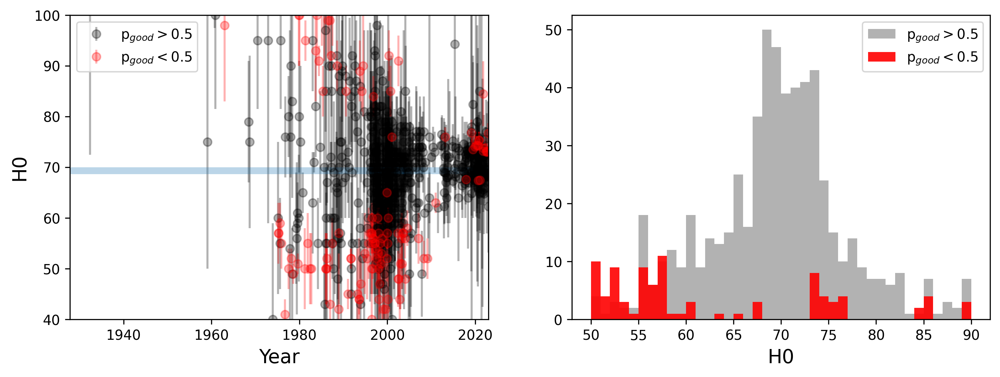

In [9]:
# all data-- old, new, not sampled
bayesian_analysis(
    H0[:],
    eH0[:],
    year_dith[:],
    p_prior=0.80,
    H0_step=4,
    H0_init=70.0,
    S=20,
    iter=1000,
)

iter: 0
iter: 100
iter: 200
iter: 300
iter: 400
iter: 500
iter: 600
iter: 700
iter: 800
iter: 900
Acceptance ratio: 0.139
Acceptance ratios between 0.2-0.3 are a good target.


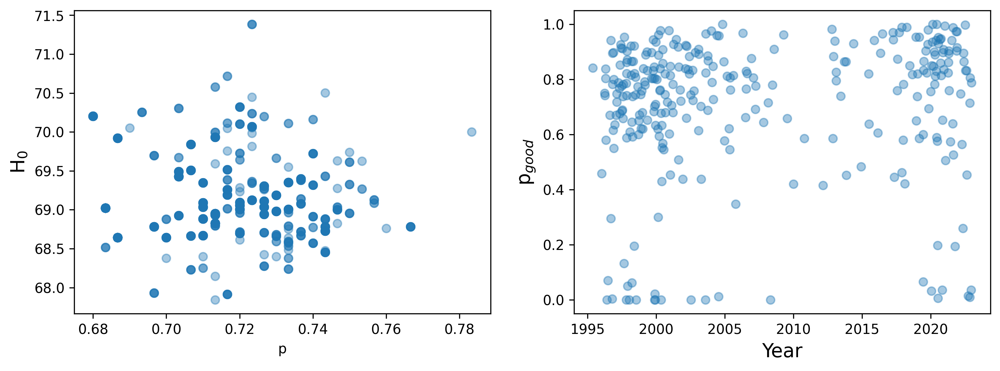

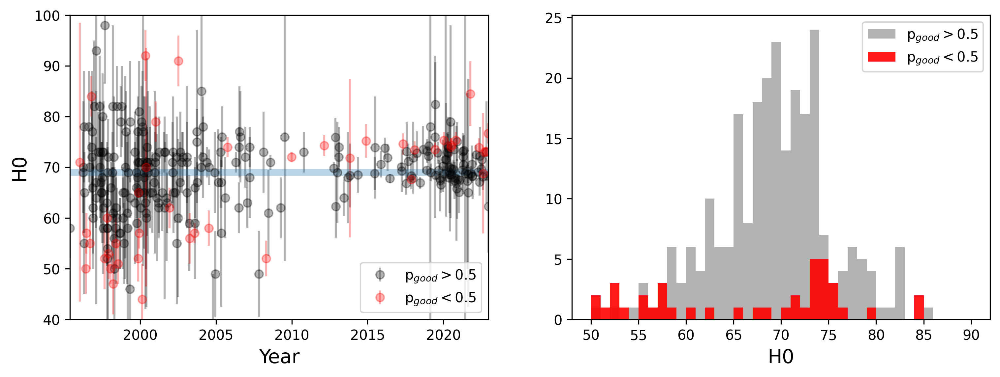

iter: 0
iter: 100
iter: 200
iter: 300
iter: 400
iter: 500
iter: 600
iter: 700
iter: 800
iter: 900
Acceptance ratio: 0.169
Acceptance ratios between 0.2-0.3 are a good target.


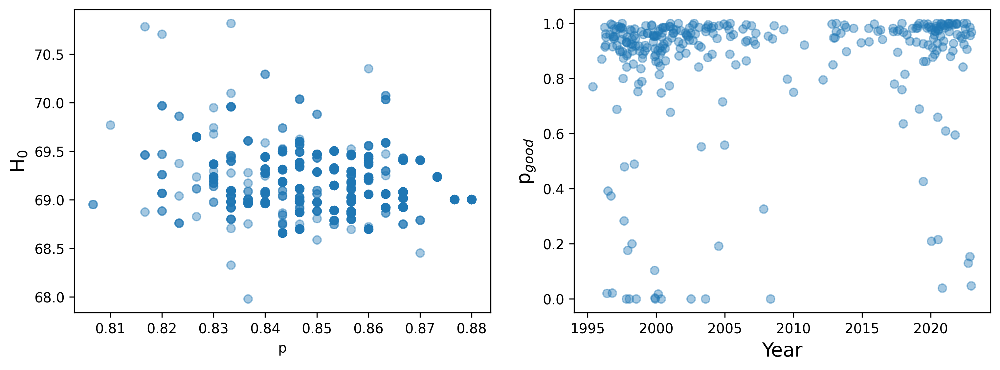

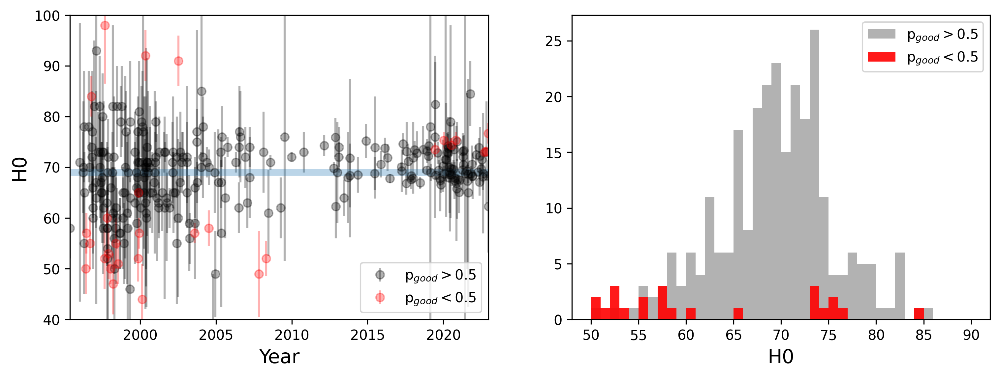

In [10]:
# changing S to be half
bayesian_analysis(
    H0[-600::2],
    eH0[-600::2],
    year_dith[-600::2],
    p_prior=0.80,
    H0_step=4,
    H0_init=70.0,
    S=10,
    iter=1000,
)
# doubling it
bayesian_analysis(
    H0[-600::2],
    eH0[-600::2],
    year_dith[-600::2],
    p_prior=0.80,
    H0_step=4,
    H0_init=70.0,
    S=40,
    iter=1000,
)

iter: 0
iter: 100
iter: 200
iter: 300
iter: 400
iter: 500
iter: 600
iter: 700
iter: 800
iter: 900
Acceptance ratio: 0.541
Acceptance ratios between 0.2-0.3 are a good target.


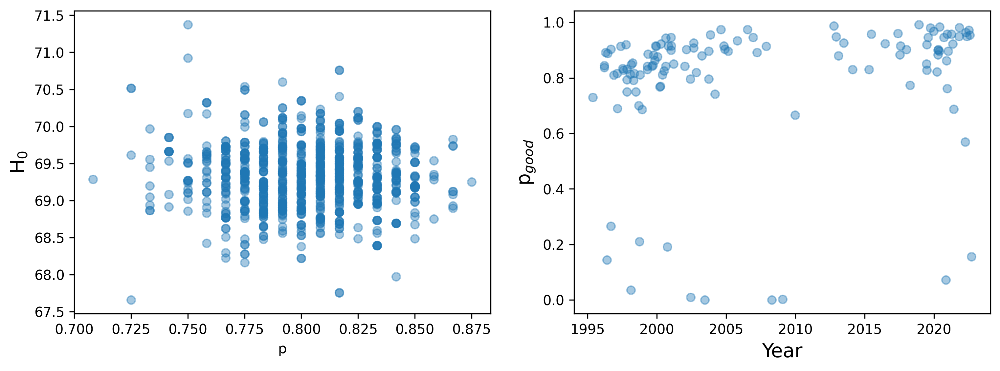

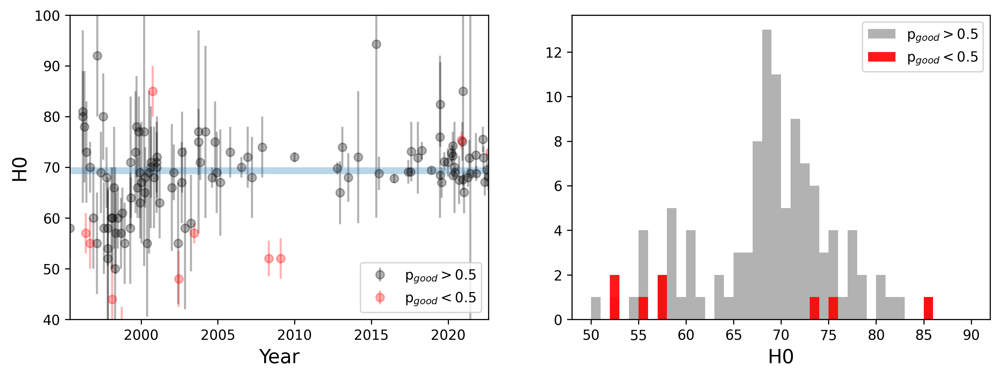

iter: 0
iter: 100
iter: 200
iter: 300
iter: 400
iter: 500
iter: 600
iter: 700
iter: 800
iter: 900
Acceptance ratio: 0.169
Acceptance ratios between 0.2-0.3 are a good target.


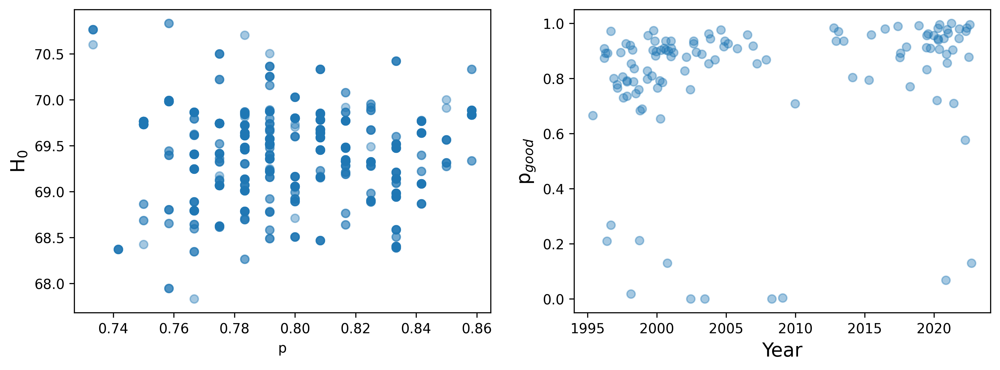

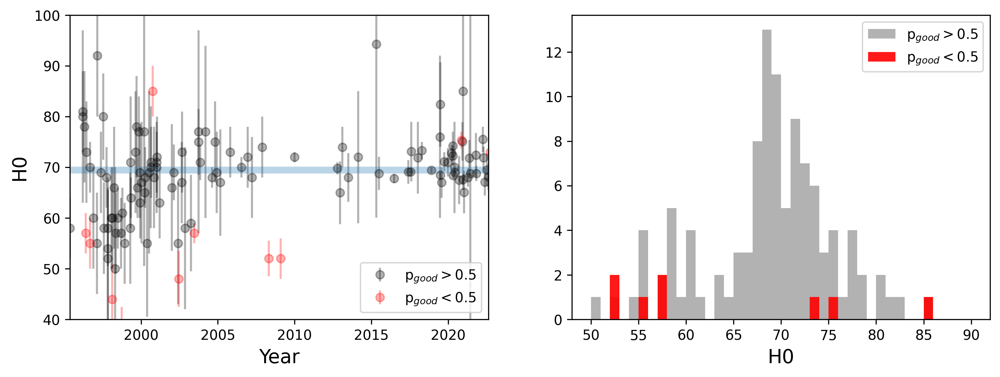

In [11]:
# change stepsizes to half and double
bayesian_analysis(
    H0[-600::5],
    eH0[-600::5],
    year_dith[-600::5],
    p_prior=0.80,
    H0_step=2,
    H0_init=70.0,
    S=20,
    iter=1000,
)

bayesian_analysis(
    H0[-600::5],
    eH0[-600::5],
    year_dith[-600::5],
    p_prior=0.80,
    H0_step=8,
    H0_init=70.0,
    S=20,
    iter=1000,
)

iter: 0
iter: 100
iter: 200
iter: 300
iter: 400
iter: 500
iter: 600
iter: 700
iter: 800
iter: 900
Acceptance ratio: 0.353
Acceptance ratios between 0.2-0.3 are a good target.


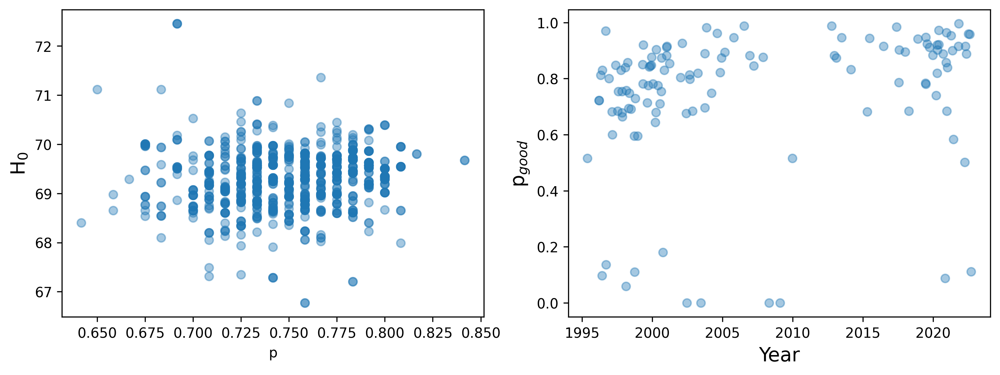

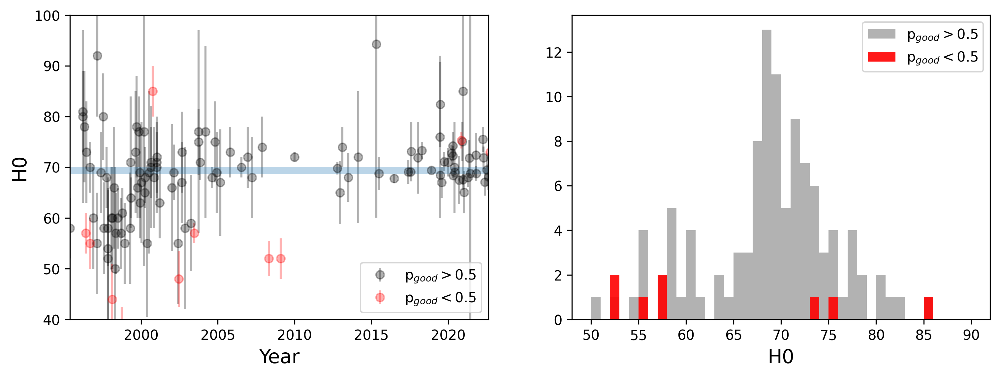

iter: 0
iter: 100
iter: 200
iter: 300
iter: 400
iter: 500
iter: 600
iter: 700
iter: 800
iter: 900
Acceptance ratio: 0.327
Acceptance ratios between 0.2-0.3 are a good target.


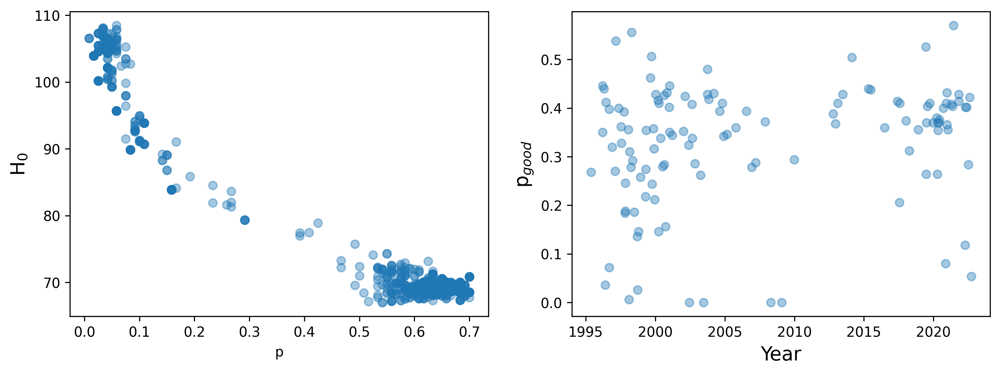

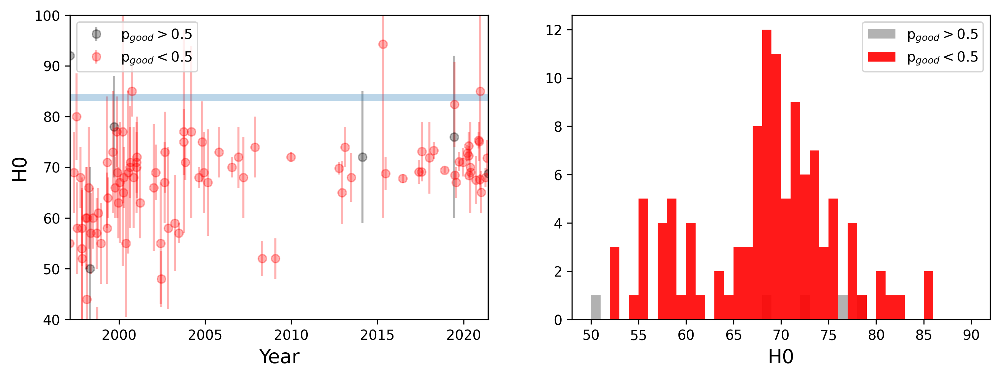

In [12]:
# changing value of p

bayesian_analysis(
    H0[-600::5],
    eH0[-600::5],
    year_dith[-600::5],
    p_prior=0.70,
    H0_step=4,
    H0_init=70.0,
    S=20,
    iter=1000,
)

bayesian_analysis(
    H0[-600::5],
    eH0[-600::5],
    year_dith[-600::5],
    p_prior=0.50,
    H0_step=4,
    H0_init=70.0,
    S=20,
    iter=1000,
)

## Questions

1. Make the plots above (for several different time ranges, and numbers of data points, H0 step sizes, values for S, etc.).  How robust is the analysis?   What changes make your acceptance rate high or low?    

> The robustness of the analysis varies for a given variable. I did different runs as can be seen above and I found the following (note, the baseline model is has an acceptance rate of 0.242): (1) as long as the cut includes relatively new data (> 1995) downsampling it does not change the result very much. (2) changing time range to include earlie data (pre-1990s) increases the scatter of the data and decreases the acceptrance ratio. This suggestst that it is coping with being able to label bad data, of which it is accepting less of. (3) I then went on to change the value of S for the fiducial S=20. Setting S=10, the acceptance ratio decreased to 0.136 and labels more data points as bad in comparison to S=20. Doubling it: S=40, marginally changes the acceptance ratio. (4) Deacreasing the step sizes flags less data as bad, increasing it does the opposite. Initially,  p_prior = 0.80 changing it to 0.70 decreases the acceptance rate. Lowering it to as much as 0.50 flags all if it as bad.

2. Describe in words how effective this method appears to be in detecting inconsistent data or outliers.  

> let's examine the fiducial analysis with baseline parameters. <img src="./H0_analysis_fiducial.png" width="800">
The method appears to cope well in identifying inconsistent data, it takes into account not only the value but also the uncertainties themselves. It is robust to certain paramter choices but some fiducial values like the prior prob, is rather sensitive.


3. What the different reasons that might make a point "good" vs. "bad"?  

> a point is good if it is close to the other data points and the error bars are reasonable-- not too small. It appears above that points with rather small error bars are flagged as bad. Also, the model assumes that the scatter in the "bad" data is better described using a normal distribution that has some standard deviation S. So bad are points that are essentially far from the blue band in the plot above and have small error bars.

4. Do you see a trend in the probability that a measurement is good vs. time?  What might that trend suggest about how data are being collected and reported?

> I notice that at early times, most of the measurements labeled bad are points that are far away from the mean and have fairly smaller error bars in comparison to the other points around the same time. At later time, there appears to be less data marked as bad. Furthermore, the data being labeled as bead are closer to the mean, but have fairly smaller error bars in comparison to the the rest of the points around that time range. This suggests that, over time the data are more clustered together-- they are more consistent, and the smaller error bars suggests a more precise measurement than early times. Maybe over time, the nature of the measurements (due to relatively the smaller error bars) are less random error dominated so the systematics start to be more important. 

### Posterior likelihood checks

Based on the results, and a mean H0 parameter derived from the sample, the below code will produce a simulated data set, assuming for convenience the same errors as the original data, and drawing from a different Gaussian distribution if the data are "good" vs. "bad"

**Question:**  How closely does the posterior sampled distribution match the real data? Perform this comparison for your analyses using a longer time baseline of H0 and also for the most recent H0 data.


 > I've modified the code to consider the following cases: (1) longer baseline by including all of the data, (2) only latest data (since ~ 2013). For the stock configuration below (more trials below this), the posterior sim gets the overall shape, witht he mean of the gaussian roughyl consistent with the original data, however it is unable to reconstruct the bimodality in the H0 measurements. Same goes with the longer baseline; it is not able to reconstruct the finer details of the distrubtion. Finally, this is the most apparent when looking at a rather short baseline by only considering latest data (> 2013). Here, the simulated posterier is a gausian with a mean centered in between the bimodal distribution seen in the original data.
 


iter: 0
iter: 100
iter: 200
iter: 300
iter: 400
iter: 500
iter: 600
iter: 700
iter: 800
iter: 900
Acceptance ratio: 0.25
Acceptance ratios between 0.2-0.3 are a good target.


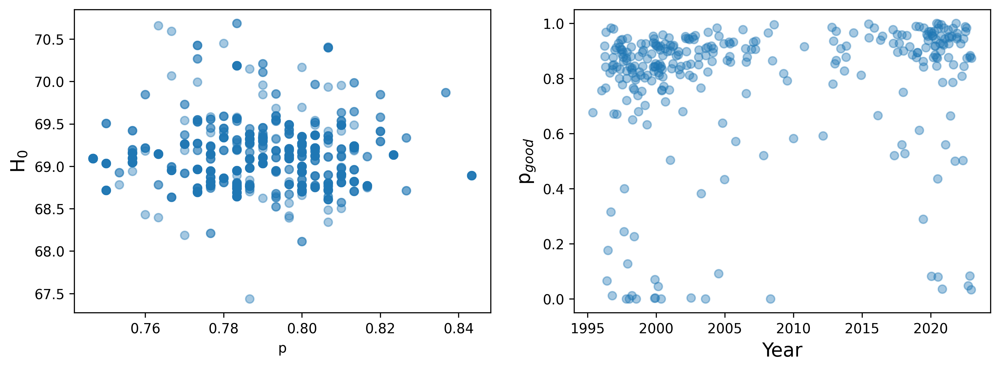

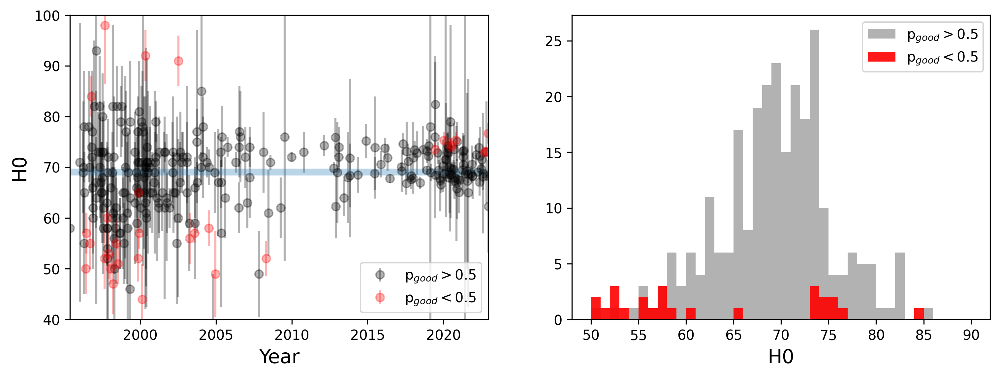

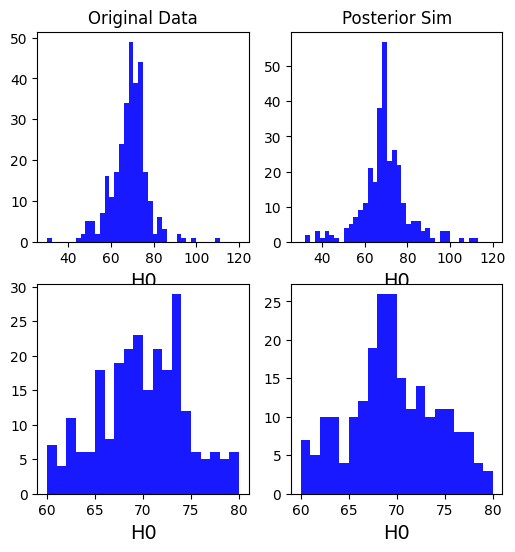

In [49]:
# includes mostly latest data we'll treat this as baseline
S = 20
(
    H0_samp_arr,
    v_samp_arr,
    p_samp_arr,
    accept_arr,
    ln_samp_arr,
    n_meas,
    p_good_arr,
    eH0arr,
    H0arr,
    year_dith_arr,
) = bayesian_analysis(
    H0[-600::2],
    eH0[-600::2],
    year_dith[-600::2],
    p_prior=0.80,
    H0_step=4,
    H0_init=70.0,
    S=S,
    iter=1000,
    verbose=True,
    savefig=True,
)

n_burn_in = 500
H0_mean = np.mean(H0_samp_arr[n_burn_in:])
H0_post_check_arr = np.zeros(n_meas)

# Generate simulated H0 values
rng = np.random.default_rng()

for i in np.arange(n_meas):
    # Draw to see if good or bad
    if np.random.uniform() < p_good_arr[i]:
        # If good, draw from sample with H0_mean ---though should include STD, with measured Standard deviation
        H0_post_check_arr[i] = H0_mean + eH0arr[i] * rng.standard_normal()
    else:
        H0_post_check_arr[i] = H0_mean + 20 * rng.standard_normal()

plt.figure(figsize=(6, 6), dpi=100)
plt.subplot(2, 2, 1)
xrange = [30, 120]
plt.hist(H0arr, bins=40, alpha=0.9, color="blue", label="Data", range=xrange)
plt.title("Original Data")
plt.xlabel("H0", fontsize=14)

plt.subplot(2, 2, 2)
xrange = [30, 120]
plt.hist(
    H0_post_check_arr, bins=40, alpha=0.9, color="blue", label="Data", range=xrange
)
plt.xlabel("H0", fontsize=14)
plt.title("Posterior Sim")


# zoom in on the H0 values
plt.subplot(2, 2, 3)
xrange = [60, 80]
plt.hist(H0arr, bins=20, alpha=0.9, color="blue", label="Data", range=xrange)
plt.xlabel("H0", fontsize=14)
plt.subplot(2, 2, 4)
xrange = [60, 80]
plt.hist(
    H0_post_check_arr, bins=20, alpha=0.9, color="blue", label="Data", range=xrange
)
plt.xlabel("H0", fontsize=14)

plt.savefig("./H0_posterior_sim_stock.png")
plt.show()

iter: 0
iter: 100
iter: 200
iter: 300
iter: 400
iter: 500
iter: 600
iter: 700
iter: 800
iter: 900
Acceptance ratio: 0.186
Acceptance ratios between 0.2-0.3 are a good target.


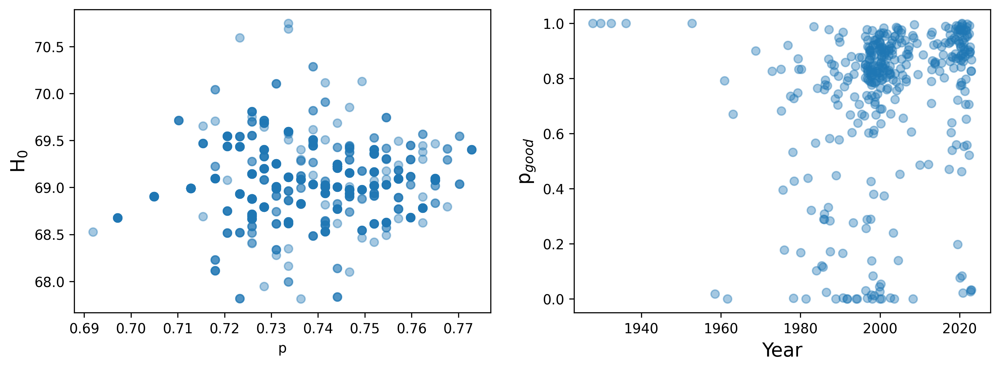

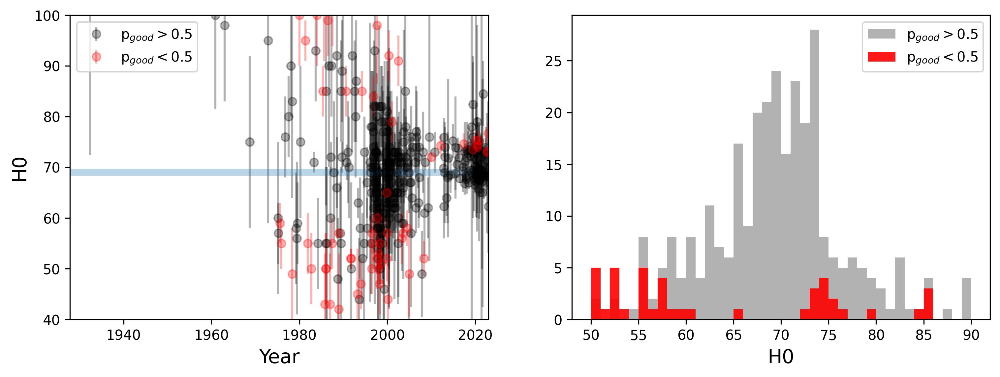

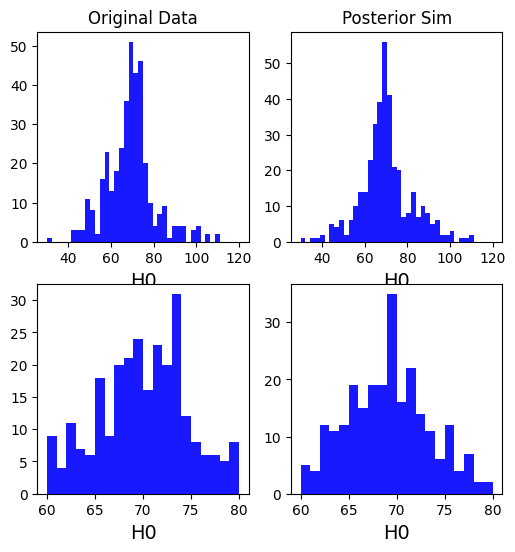

In [50]:
# includes all data-- longer baseline
S = 20
(
    H0_samp_arr,
    v_samp_arr,
    p_samp_arr,
    accept_arr,
    ln_samp_arr,
    n_meas,
    p_good_arr,
    eH0arr,
    H0arr,
    year_dith_arr,
) = bayesian_analysis(
    H0[-1000::2],
    eH0[-1000::2],
    year_dith[-1000::2],
    p_prior=0.80,
    H0_step=4,
    H0_init=70.0,
    S=S,
    iter=1000,
    verbose=True,
    savefig=True,
)

n_burn_in = 500
H0_mean = np.mean(H0_samp_arr[n_burn_in:])
H0_post_check_arr = np.zeros(n_meas)

# Generate simulated H0 values
rng = np.random.default_rng()

for i in np.arange(n_meas):
    # Draw to see if good or bad
    if np.random.uniform() < p_good_arr[i]:
        # If good, draw from sample with H0_mean ---though should include STD, with measured Standard deviation
        H0_post_check_arr[i] = H0_mean + eH0arr[i] * rng.standard_normal()
    else:
        H0_post_check_arr[i] = H0_mean + 20 * rng.standard_normal()

plt.figure(figsize=(6, 6), dpi=100)
plt.subplot(2, 2, 1)
xrange = [30, 120]
plt.hist(H0arr, bins=40, alpha=0.9, color="blue", label="Data", range=xrange)
plt.title("Original Data")
plt.xlabel("H0", fontsize=14)

plt.subplot(2, 2, 2)
xrange = [30, 120]
plt.hist(
    H0_post_check_arr, bins=40, alpha=0.9, color="blue", label="Data", range=xrange
)
plt.xlabel("H0", fontsize=14)
plt.title("Posterior Sim")


# zoom in on the H0 values
plt.subplot(2, 2, 3)
xrange = [60, 80]
plt.hist(H0arr, bins=20, alpha=0.9, color="blue", label="Data", range=xrange)
plt.xlabel("H0", fontsize=14)
plt.subplot(2, 2, 4)
xrange = [60, 80]
plt.hist(
    H0_post_check_arr, bins=20, alpha=0.9, color="blue", label="Data", range=xrange
)
plt.xlabel("H0", fontsize=14)
plt.savefig("./H0_posterior_sim_longerbaseline.png")
plt.show()

iter: 0
iter: 100
iter: 200
iter: 300
iter: 400
iter: 500
iter: 600
iter: 700
iter: 800
iter: 900
Acceptance ratio: 0.262
Acceptance ratios between 0.2-0.3 are a good target.


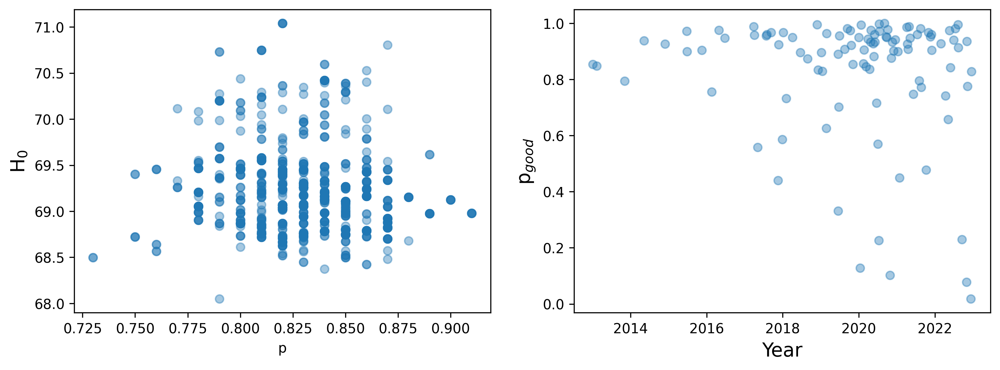

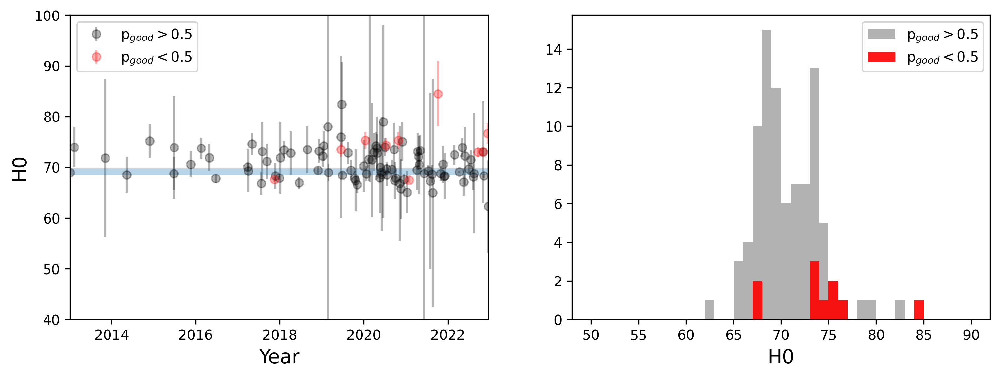

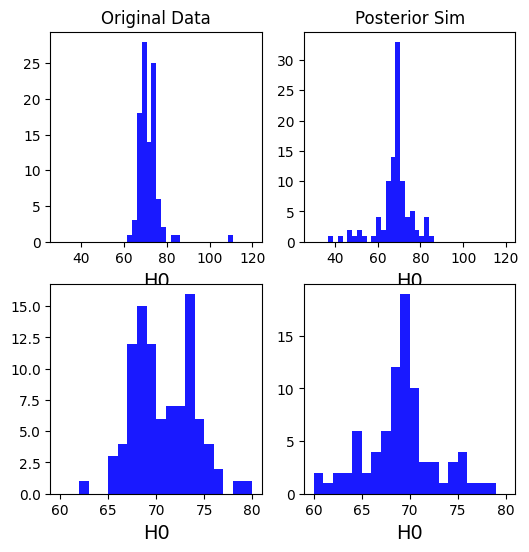

In [51]:
# only the most recent data
S = 20
(
    H0_samp_arr,
    v_samp_arr,
    p_samp_arr,
    accept_arr,
    ln_samp_arr,
    n_meas,
    p_good_arr,
    eH0arr,
    H0arr,
    year_dith_arr,
) = bayesian_analysis(
    H0[-200::2],
    eH0[-200::2],
    year_dith[-200::2],
    p_prior=0.80,
    H0_step=4,
    H0_init=70.0,
    S=S,
    iter=1000,
    verbose=True,
    savefig=True,
)

n_burn_in = 500
H0_mean = np.mean(H0_samp_arr[n_burn_in:])
H0_post_check_arr = np.zeros(n_meas)

# Generate simulated H0 values
rng = np.random.default_rng()

for i in np.arange(n_meas):
    # Draw to see if good or bad
    if np.random.uniform() < p_good_arr[i]:
        # If good, draw from sample with H0_mean ---though should include STD, with measured Standard deviation
        H0_post_check_arr[i] = H0_mean + eH0arr[i] * rng.standard_normal()
    else:
        H0_post_check_arr[i] = H0_mean + 20 * rng.standard_normal()

plt.figure(figsize=(6, 6), dpi=100)
plt.subplot(2, 2, 1)
xrange = [30, 120]
plt.hist(H0arr, bins=40, alpha=0.9, color="blue", label="Data", range=xrange)
plt.title("Original Data")
plt.xlabel("H0", fontsize=14)

plt.subplot(2, 2, 2)
xrange = [30, 120]
plt.hist(
    H0_post_check_arr, bins=40, alpha=0.9, color="blue", label="Data", range=xrange
)
plt.xlabel("H0", fontsize=14)
plt.title("Posterior Sim")


# zoom in on the H0 values
plt.subplot(2, 2, 3)
xrange = [60, 80]
plt.hist(H0arr, bins=20, alpha=0.9, color="blue", label="Data", range=xrange)
plt.xlabel("H0", fontsize=14)
plt.subplot(2, 2, 4)
xrange = [60, 80]
plt.hist(
    H0_post_check_arr, bins=20, alpha=0.9, color="blue", label="Data", range=xrange
)
plt.xlabel("H0", fontsize=14)
plt.savefig("./H0_posterior_sim_latest.png")
plt.show()

#### Alternate way to visualize which values are "good" or consistent, and which are not

Since the posterior distribution is a combination (or mixture) of the "good" and "bad" distributions
we can determine the probability that data point is a member of the distribution describing "good" points by
evaluating 

`P_good_member = P_good[i]/(P_good[i]+P_bad[i])` 

The code below calculates that ratio.

Fraction of data with p_good > 0.5:  0.655


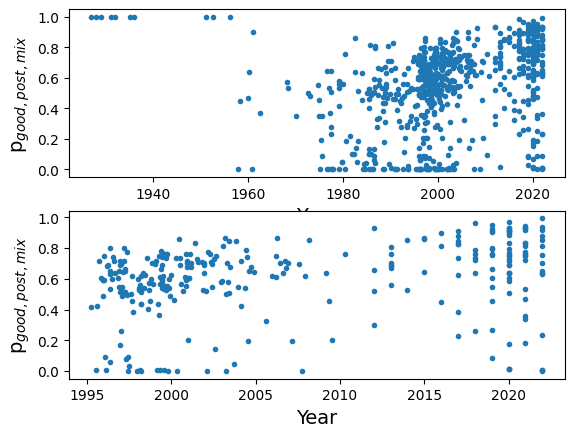

Fraction of data with p_good > 0.5:  0.777


In [14]:
#
# Assumes S from above

# plot for all data

plt.subplot(2, 1, 1)
dmin = 0
dstep = 1

n_meas = len(H0[dmin::dstep])
H0arr_alt = H0[dmin::dstep]
eH0arr_alt = eH0[dmin::dstep]
year_alt = year[dmin::dstep]
H0_par = np.median(H0_samp_arr)
p_par = np.median(p_samp_arr)

p_good_arr = np.zeros(n_meas)
for i in np.arange(n_meas):
    pGi = (1.0 / np.sqrt(2.0 * np.pi * eH0arr_alt[i] ** 2)) * np.exp(
        -((H0arr_alt[i] - H0_par) ** 2) / (2.0 * eH0arr_alt[i] ** 2)
    )
    pBi = (1.0 / np.sqrt(2.0 * np.pi * S**2)) * np.exp(
        -((H0arr_alt[i] - H0_par) ** 2) / (2.0 * S**2)
    )
    p_good_arr[i] = pGi / (pGi + pBi)


plt.plot(year_alt, p_good_arr, ".")
plt.xlabel("Year", fontsize=14)
plt.ylabel("p$_{good, post, mix}$", fontsize=14)

# Restrict to subset of more recent data

print("Fraction of data with p_good > 0.5: %6.3f" % np.mean(p_good_arr > 0.5))

plt.subplot(2, 1, 2)
dmin = -600
dstep = 2

n_meas = len(H0[dmin::dstep])
H0arr_alt = H0[dmin::dstep]
eH0arr_alt = eH0[dmin::dstep]
year_alt = year[dmin::dstep]
H0_par = np.median(H0_samp_arr)
p_par = np.median(p_samp_arr)

p_good_arr = np.zeros(n_meas)
for i in np.arange(n_meas):
    pGi = (1.0 / np.sqrt(2.0 * np.pi * eH0arr_alt[i] ** 2)) * np.exp(
        -((H0arr_alt[i] - H0_par) ** 2) / (2.0 * eH0arr_alt[i] ** 2)
    )
    pBi = (1.0 / np.sqrt(2.0 * np.pi * S**2)) * np.exp(
        -((H0arr_alt[i] - H0_par) ** 2) / (2.0 * S**2)
    )
    p_good_arr[i] = pGi / (pGi + pBi)


plt.plot(year_alt, p_good_arr, ".")
plt.xlabel("Year", fontsize=14)
plt.ylabel("p$_{good, post, mix}$", fontsize=14)
plt.show()


print("Fraction of data with p_good > 0.5: %6.3f" % np.mean(p_good_arr > 0.5))

## Final Conclusions (for Bayesian H0 analysis following Press (2017)) 

**To-do**: Briefly write your overall conclusions regarding the aspects of this method that provide useful insight into the compilation of H0 measurements.   At the same time, what might be some of the shortcomings of the model, as we have implemented it?



> This method is a good start, finding likely outliers. The method is based on the assumption that the data points are drawn from a Gaussian distribution with a mean value of H0 and a standard deviation of eH0, using a bayseina approach to estimate the probability that a data point is an outlier, based on the measured value of H0 and its uncertainty. The weighting is good: the values are assigned to each data point based on this probability, with higher weights assigned to points that are more likely to be outliers. The method can be used to identify data points that are more likely to be outliers, and to down-weight these data points in subsequent analyses. However, the gaussian assumption may not always apply so having a more flexible function for this, in this case of multi modal data, could be good. 

In [15]:
# Interesting diagnostic plot, but skip for now!

# H0len=len(H0)

# H0arr=H0[-30:]
# eH0arr=eH0[-30:]
# n_meas=len(H0arr)

# statim=np.zeros((99,99))

# for j in np.arange(99):
#    H0_par=j+20
#    for i in np.arange(99):
#        p=(i+1)/100.0
#        statim[i,j]=prob_def_eq_16(H0arr,eH0arr,H0_par,p,S)
#
# plt.imshow(statim)
# plt.show()

# print(np.sum(statim),np.max(statim))

# Monte Carlo Markov Chain sampling of the posterior/likelihood (e.g. for integration

Below is the code template that we were using in class to generate a Metropolis MCMC sampler.  Complete the code and include it below (or submit separate notebook---the Lab3b_Stats_H0_and_MCMC.ipynb notebook in collaboratory)  

Here we will be partially following the methods of Hogg and Foreman-Mackey (2017) https://arxiv.org/abs/1710.06068

> After running the code, we see that the MCMC has successfully sampled the distribution of theta values, converging to the true distribution of theta values. See the true distribution in green. The burn-in period is important as the distribution stabilizes after the initial transient period-- the width or standard deviation gets less, and the stray samples away from the starting point gets less. The MCMC algorithm has effectively explored -- you can see it goes from the initial guess, actually overshoots to the left and then coverges -- the parameter space and sampled the posterior distribution of theta values.

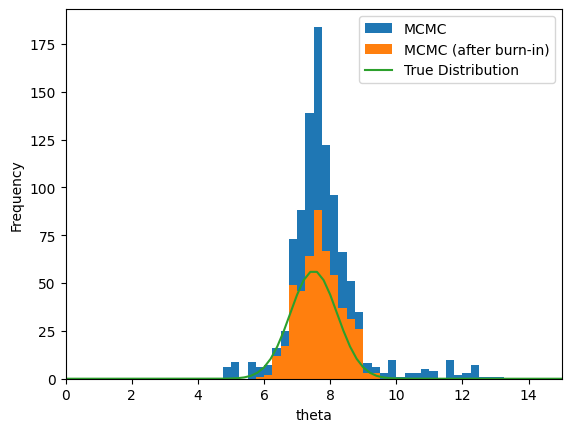

In [16]:
def f(theta, data_mu):
    """
    un-normalized probability distribution for theta, given data - in this case data_mu
    theta is a single value
    data_mu is a single value
    Assume 1-D gaussian distribution with sigma = 1
    """
    return np.exp(-((theta - data_mu) ** 2))


def proposal(theta, scale):
    # Propose a step from current theta.  Sample from a uniform distribution with step scale size
    step = scale * (np.random.uniform() - 0.5)
    new_theta = theta + step
    return new_theta


# Criteria for rejecting the step
# How does probability at the new step compare?
# Reject if the ratio is higher than a number between 0 and 1, taken from a uniform distribution
def reject(theta, new_theta, data_mu):
    # Draw from uniform distribution
    ratio_test = np.random.uniform()
    if (f(new_theta, data_mu) / f(theta, data_mu)) > ratio_test:
        return 0
    else:
        return 1


# Have Monte Carlo Markov Chain step 1000 times

# Make array to store parameter samples
len = 1000
theta_arr = np.zeros(len)

#  Parameters of our gaussian from our data
data_mu = 7.5  # mean of data

# Starting points
init = 13  # Initial guess for theta
scale = 1.0  # Largest step size = scale/2


theta_arr[0] = init
for i in np.arange(len - 1):
    theta = theta_arr[i]

    #   Make a proposal for where to step next
    new_theta = proposal(theta, scale)

    #   If proposal passes test, then step there, otherwise keep value
    if reject(theta, new_theta, data_mu) == 0:
        theta_arr[i + 1] = new_theta
    else:
        theta_arr[i + 1] = theta


#  Plot Results!
xrange = (0, 15)
plt.hist(
    theta_arr,
    bins=60,
    range=xrange,
    label="MCMC",
)
plt.hist(theta_arr[500:], bins=60, range=xrange, label="MCMC (after burn-in)")
xax = np.arange(300) * 0.2
norm = np.sum(f(xax, data_mu))
plt.plot(xax, 500 * f(xax, data_mu) / norm, label="True Distribution")
plt.xlim(xrange)
plt.xlabel("theta")
plt.ylabel("Frequency")
plt.legend()
plt.show()